# load

In [49]:

custom_leiden_res = 0.1

import json
import scanpy as sc
import pandas as pd
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
import warnings
from tqdm import TqdmWarning
warnings.filterwarnings("ignore", category=TqdmWarning)
import sys
import types
import os


def load_lukassen():
    os.chdir("/Users/oskarhaupt/Documents/DE/2024_FU-Bachelor/WS-24-25/Charité/05_sorted/18_soupX_try/08_DEanalysis")

    with open("../02_mapped_gene_markers/exclusive_gene_markers.json", "r") as f:
    #with open("../02_mapped_gene_markers/all_gene_markers.json", "r") as f:
        marker_genes = json.load(f)

    adata = sc.read_h5ad("../04_soup/pyED_correct_soupx.h5ad")
    #adata = sc.read_h5ad("../../data/pyED_correct.h5ad")

    json_marker_cell_types = list(marker_genes.keys())
    print(marker_genes)

    return (adata, marker_genes, json_marker_cell_types)


def load_paper():
    os.chdir("/Users/oskarhaupt/Documents/DE/2024_FU-Bachelor/WS-24-25/Charité/05_sorted/18_soupX_try/08_DEanalysis")

    adata = sc.read_h5ad("../04_soup/pyED_correct_soupx.h5ad")

    paper_marker_genes = {
        "SSCs": ["GFRA1", "KIT", "STRA8"],
        "DiffingSPG": ["GFRA1", "KIT", "STRA8"],
        "DiffedSPG": ["GFRA1", "KIT", "STRA8"],
        "Leptotene": ["SPO11", "TEX19"], #tex19 in leptotene spermatcytes
        "Zygotene": ["SPO11"],
        "PachyteneDiplotene": ["OVOL1", "OVOL2", "NME8"], #NME8 more of pachytene
        "RoundSpermatids": ["TXNDC2"],
        # Elongated Spermatids: ["TXNDC2", "TNP1", "PRM1"], #where formed inbetween round and sperm so hard to destinguish
        "Sperm": ["TNP1", "PRM1"],
        "Macrophages": ["CD163", "CD14"],
        "Endothelial": ["PECAM1", "VWF"],
        "Leydig": ["VIT", "IGF1", "DLK1"],
        "Myoid": ["MYH11", "GLI1", "ACTA2"],
        "Sertoli": ["PRND", "WFDC2", "AMH", "SOX9"],
        "Pericytes": ["NOTCH3", "SLIT3", "PDGFRB", "MCAM"],
    }
    print(paper_marker_genes)

    paper_cell_types = list(paper_marker_genes.keys())

    return (adata, paper_marker_genes, paper_cell_types)


{'Early Sgonia': ['GFRA1', 'ID4', 'SOHLH1', 'SOHLH2', 'POU5F1', 'UCHL1', 'ITGB1', 'ITGA6', 'NGN3', 'SOX3', 'RET', 'LIN28A', 'ZBTB16', 'NOS2', 'EPCAM', 'BMI1'], 'Late Sgonia': ['DAZL', 'RAD51', 'STRA8', 'HIST1H1A', 'PCNA', 'TEX11', 'NANOS3', 'E2F1', 'HIST1H3A', 'WSB2', 'ESX1', 'USP26', 'SALL4', 'NLRP4C', 'CCNA2', 'CCNE2', 'CCND1', 'CRABP1', 'ESRP1', 'ADGRA3', 'CDKN1C', 'PER1', 'LIN28A', 'FIGLA', 'UTF1', 'HIST1H4M', 'FTHL17'], 'Early Scytes': ['DMC1', 'MEIOB', 'GPAT2'], 'Late Scytes': ['KDM3A', 'POU5F2'], 'Round Stids': ['SLX', 'HILS1', 'KLF17', 'CRISP2', 'AKAP4'], 'Later Stids': ['SUFU', 'DLL1', '1700024P04RIK', 'PRM1', 'DYRK4', 'TNP1', 'HSPA1L'], 'Sertoli': ['ID3', 'SOX8', 'RHOX5', 'TFCP2', 'WT1', 'GATA1', 'KITL'], 'Leydig': ['CYP17A1', 'HSD17B11', 'CSF1', 'VCAM1', 'HSD3B6']}


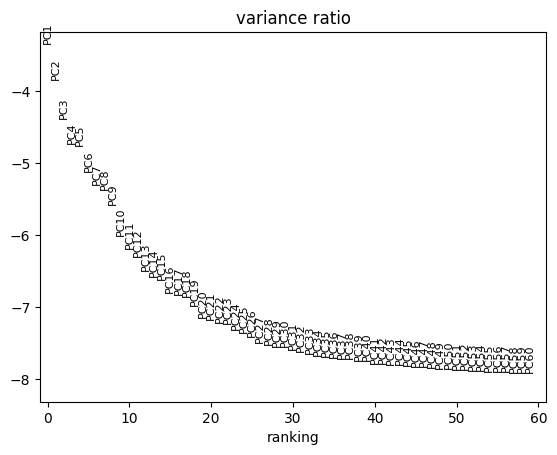

In [50]:
adata, marker, celltypes = load_lukassen()
sc.pp.filter_genes(adata, min_counts=3)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
#sc.pp.highly_variable_genes(adata, n_top_genes=3000)
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, n_comps=60, svd_solver="arpack")
sc.pl.pca_variance_ratio(adata, n_pcs=60, log=True)

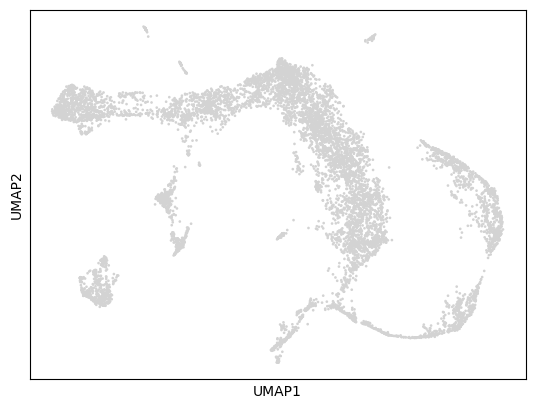

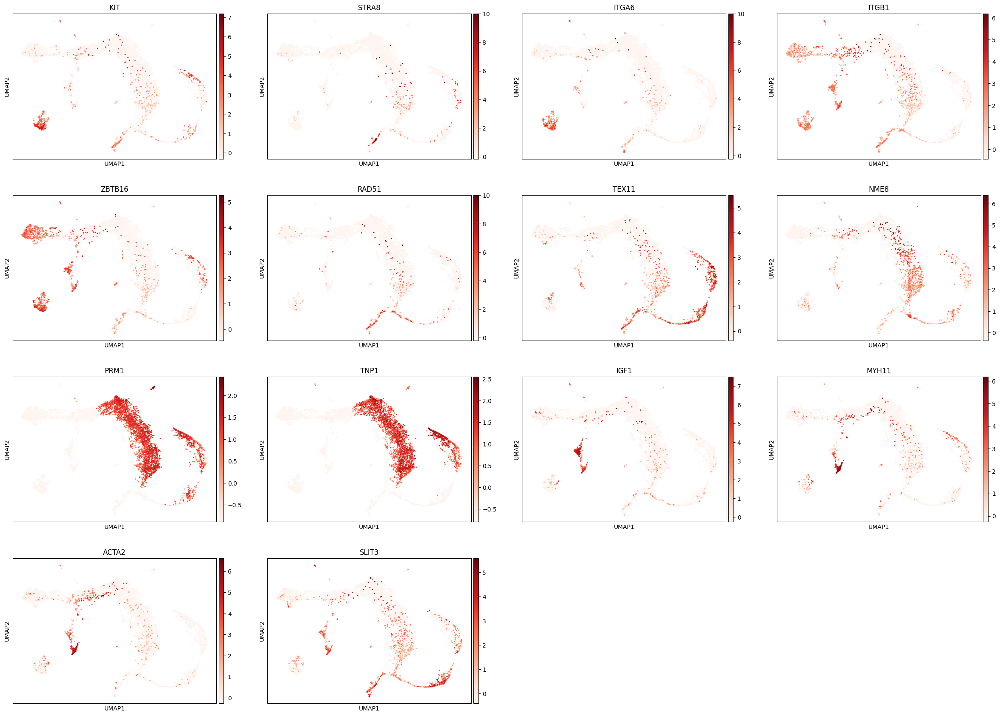

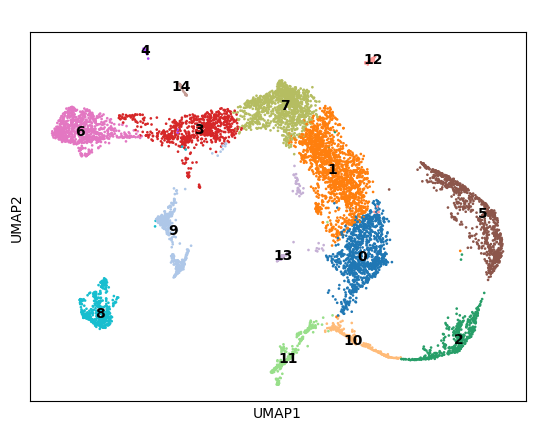

In [52]:
sc.pp.neighbors(adata, n_neighbors=50, n_pcs=50, method="umap")  # fewer neighbors & gaussian kernel for more linear manifolds
sc.tl.umap(
    adata,
    min_dist=0.1,      # smaller min_dist for tighter, more condensed paths
    spread=0.6,         # smaller spread to focus on narrow/linear structure
    n_components=2,
    random_state=42, 
    #negative_sample_rate=10   # encourages separating linear trajectories
)
#print("genes: ", adata.var)
sc.pl.umap(adata)
sc.pl.umap(adata, color=["KIT", "STRA8", "ITGA6", "ITGB1", "ZBTB16", "RAD51", "TEX11", "NME8", "PRM1", "TNP1", "IGF1", "MYH11", "ACTA2", "SLIT3"], cmap="Reds")
sc.tl.leiden(adata, resolution=0.55, flavor="igraph", n_iterations=2, directed=False, key_added="leiden_res")
sc.pl.umap(adata, color="leiden_res", legend_loc="on data", title=" ")

In [ ]:
# wilcoxon
sc.tl.rank_genes_groups(
    adata, groupby="leiden_res", method="wilcoxon", key_added="dea_leiden_res"
)

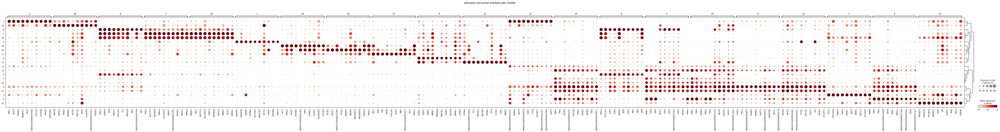

In [42]:
sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden_res", standard_scale="var", key="dea_leiden_res", cmap="Reds", title="wilcoxon exclusive markers per cluster"
)

## function

In [ ]:
def DifferentialExpressionAnalysis(adata, marker_genes, cell_types, leiden_res=0.2):
    # Suppress the specific tqdm IProgress warning for a cleaner notebook
    try:
        import tqdm.auto
    except Exception:
        pass
    try:
        import tqdm.autonotebook
        if hasattr(tqdm.autonotebook, 'tqdm'):
            tqdm.autonotebook.tqdm = tqdm.auto.tqdm
    except Exception:
        pass

    import os

    res_print = str(leiden_res).replace('.', '_')
    print("Running Differential Expression Analysis with Resolution: ".upper(), leiden_res)
    print("CREATING PLOTS FOR ALL THESE CELL TYPES:\n", cell_types)

    sc.pp.filter_genes(adata, min_counts=1)
    # highly variable genes
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    #sc.pp.scale(adata)
    #sc.pp.highly_variable_genes(adata, n_top_genes=1000)
    sc.tl.pca(adata, n_comps=50, svd_solver="arpack")
    sc.pp.neighbors(adata, n_neighbors=50, n_pcs=50, method="umap")
    sc.tl.umap(
        adata,
        min_dist=0.2,      
        spread=1,         
        n_components=2,
        random_state=42, 
    )
    sc.pl.umap(
        adata,
        color=None,
        save=f"_{res_print}_umap_simple.png"
    )

    marker_genes_in_data = {}
    for ct, markers in marker_genes.items():
        markers_found = []
        for marker in markers:
            if marker in adata.var.index:
                markers_found.append(marker)
        marker_genes_in_data[ct] = markers_found

    img_count = 1
    for ct in cell_types:
        print(f"{ct.upper()}:")
        genes_to_plot = marker_genes_in_data.get(ct, [])
        if not genes_to_plot:
            print(f"  [SKIP] No marker genes found for {ct} in adata.var.index; skipping UMAP plot.")
            continue

        fname = f"_{res_print}_{img_count}_{ct.replace(' ', '')}.png"
        sc.pl.umap(
            adata,
            color=genes_to_plot,
            vmin=0,
            vmax=3,  # Always use fixed scale [0, 3]
            sort_order=False,
            frameon=False,
            cmap="Reds",
            show=False,
            save=fname,
        )
        img_count += 1

    leiden_fname = f"_{res_print}_leiden_res.png"
    sc.tl.leiden(adata, resolution=leiden_res, flavor="igraph", n_iterations=2, directed=False, key_added="leiden_res")
    sc.pl.umap(adata, color="leiden_res", save=leiden_fname, legend_loc="on data")

    found_markers = {
        ct: [m for m in ct_markers if m in adata.var.index]
        for ct, ct_markers in marker_genes.items()
        if ct in cell_types
    }

    dot_fname = f"_{res_print}_exclusive_dotplot_leiden_res.png"
    sc.pl.dotplot(
        adata,
        groupby=f"leiden_res",
        var_names=found_markers,
        standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
        cmap = "Reds",
        save = dot_fname,
        title = "exclusive markers per cluster",
    )

    wilcoxon_dotplot_fname = f"{res_print}_exclusive_wilcoxon_dotplot.png"
    sc.tl.rank_genes_groups(
        adata, groupby="leiden_res", method="wilcoxon", key_added="dea_leiden_res"
    )
    sc.pl.rank_genes_groups_dotplot(
        adata, groupby="leiden_res", standard_scale="var", key="dea_leiden_res", save=wilcoxon_dotplot_fname, cmap="Reds",
        var_names=found_markers, title="wilcoxon exclusive markers per cluster"
    )
    wilcoxon_dotplot_fname = f"{res_print}_wilcoxon_dotplot.png"
    sc.pl.rank_genes_groups_dotplot(
        adata, groupby="leiden_res", standard_scale="var", n_genes=5, key="dea_leiden_res", save=wilcoxon_dotplot_fname, cmap="Reds",
         title="wilcoxon DEA markers per cluster"
    )

    # Create a single figure with all marker gene violins in a 4 x Y layout (leiden_res clusters)
    all_marker_genes = []
    for markers in found_markers.values():
        all_marker_genes.extend(markers)
    # Remove duplicates while preserving order
    seen = set()
    all_marker_genes_unique = [x for x in all_marker_genes if not (x in seen or seen.add(x))]
    if all_marker_genes_unique:
        n_cols = 4
        n_genes = len(all_marker_genes_unique)
        n_rows = (n_genes + n_cols - 1) // n_cols

        fig, axes = plt.subplots(
            nrows=n_rows, ncols=n_cols, figsize=(n_cols * 5, n_rows * 4), squeeze=False
        )

        # Flatten axes for easy indexing
        axes = axes.flatten()
        # Plot one gene per axis
        for idx, gene in enumerate(all_marker_genes_unique):
            ax = axes[idx]
            # Use Scanpy's violin with show=False, specifying the axis
            sc.pl.violin(
                adata,
                keys=gene,
                groupby="leiden_res",
                ax=ax,
                show=False,
            )
            # Set y-label font size and style
            ax.set_ylabel(gene, fontsize=22, fontweight='bold')
            ax.set_title("")  # Remove title for each subplot for clarity

            # Hide individual axis xlabel (group axis)
            ax.set_xlabel("")
        # Hide unused axes
        for idx in range(len(all_marker_genes_unique), len(axes)):
            fig.delaxes(axes[idx])

        plt.tight_layout()
        violin_fname = f"figures/violin_{res_print}_leiden_res_all.png"
        fig.savefig(violin_fname, bbox_inches="tight")
        plt.show()
    else:
        print("No marker genes found to plot violins.")

    # --- Add: Top 5 DEA gene violins out of wilcoxon test (key="dea_leiden_res") ---
    try:
        # Extract top 5 genes per leiden_res cluster from wilcoxon results (key="dea_leiden_res")
        top_n = 5
        group_names = adata.uns["dea_leiden_res"]["names"].dtype.names
        top5_genes = []
        for group in group_names:
            names = adata.uns["dea_leiden_res"]["names"][group][:top_n]
            top5_genes.extend(names)
        # Remove duplicates while preserving order
        seen = set()
        top5_genes_unique = [g for g in top5_genes if (g not in seen and not seen.add(g))]
        if top5_genes_unique:
            n_cols = 4
            n_genes = len(top5_genes_unique)
            n_rows = (n_genes + n_cols - 1) // n_cols

            fig, axes = plt.subplots(
                nrows=n_rows, ncols=n_cols, figsize=(n_cols * 5, n_rows * 4), squeeze=False
            )

            axes = axes.flatten()
            for idx, gene in enumerate(top5_genes_unique):
                ax = axes[idx]
                sc.pl.violin(
                    adata,
                    keys=gene,
                    groupby="leiden_res",
                    ax=ax,
                    show=False,
                )
                ax.set_ylabel(gene, fontsize=22, fontweight='bold')
                ax.set_title("")
                ax.set_xlabel("")
            # Hide unused axes
            for idx in range(len(top5_genes_unique), len(axes)):
                fig.delaxes(axes[idx])

            plt.tight_layout()
            violin_fname = f"figures/violin_{res_print}_leiden_res_wilcox_top5.png"
            fig.savefig(violin_fname, bbox_inches="tight")
            plt.show()
        else:
            print("No DEA top-5 genes found to plot violins.")
    except Exception as e:
        print(f"Error extracting or plotting DEA violin plots: {e}")

    return adata


# Lukassen

{'Early Sgonia': ['GFRA1', 'ID4', 'SOHLH1', 'SOHLH2', 'POU5F1', 'UCHL1', 'ITGB1', 'ITGA6', 'NGN3', 'SOX3', 'RET', 'LIN28A', 'ZBTB16', 'NOS2', 'EPCAM', 'BMI1'], 'Late Sgonia': ['DAZL', 'RAD51', 'STRA8', 'HIST1H1A', 'PCNA', 'TEX11', 'NANOS3', 'E2F1', 'HIST1H3A', 'WSB2', 'ESX1', 'USP26', 'SALL4', 'NLRP4C', 'CCNA2', 'CCNE2', 'CCND1', 'CRABP1', 'ESRP1', 'ADGRA3', 'CDKN1C', 'PER1', 'LIN28A', 'FIGLA', 'UTF1', 'HIST1H4M', 'FTHL17'], 'Early Scytes': ['DMC1', 'MEIOB', 'GPAT2'], 'Late Scytes': ['KDM3A', 'POU5F2'], 'Round Stids': ['SLX', 'HILS1', 'KLF17', 'CRISP2', 'AKAP4'], 'Later Stids': ['SUFU', 'DLL1', '1700024P04RIK', 'PRM1', 'DYRK4', 'TNP1', 'HSPA1L'], 'Sertoli': ['ID3', 'SOX8', 'RHOX5', 'TFCP2', 'WT1', 'GATA1', 'KITL'], 'Leydig': ['CYP17A1', 'HSD17B11', 'CSF1', 'VCAM1', 'HSD3B6']}
RUNNING DIFFERENTIAL EXPRESSION ANALYSIS WITH RESOLUTION:  0.2
CREATING PLOTS FOR ALL THESE CELL TYPES:
 ['Early Sgonia', 'Late Sgonia', 'Early Scytes', 'Late Scytes', 'Round Stids', 'Later Stids', 'Sertoli', 'Ley

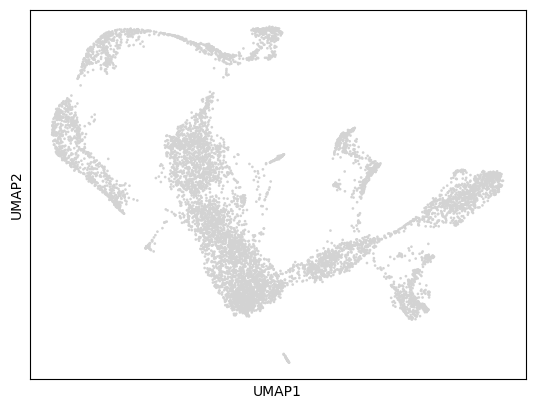

EARLY SGONIA:
LATE SGONIA:
EARLY SCYTES:
LATE SCYTES:
ROUND STIDS:
LATER STIDS:
SERTOLI:
LEYDIG:


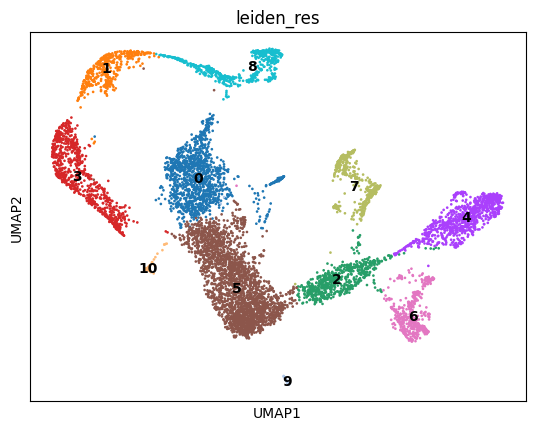

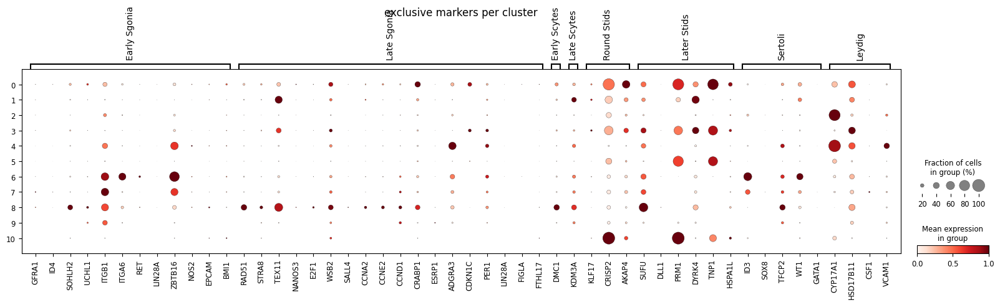

categories: 0, 1, 2, etc.
var_group_labels: Early Sgonia, Late Sgonia, Early Scytes, etc.


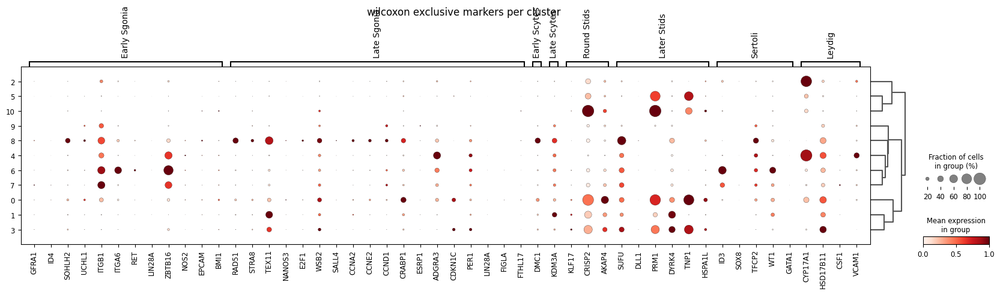

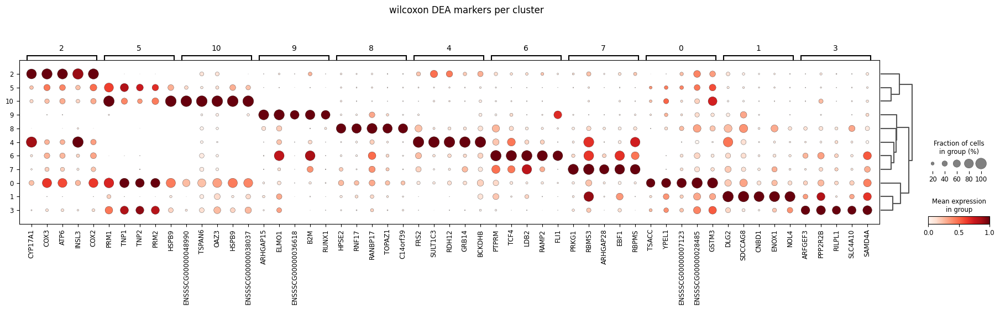

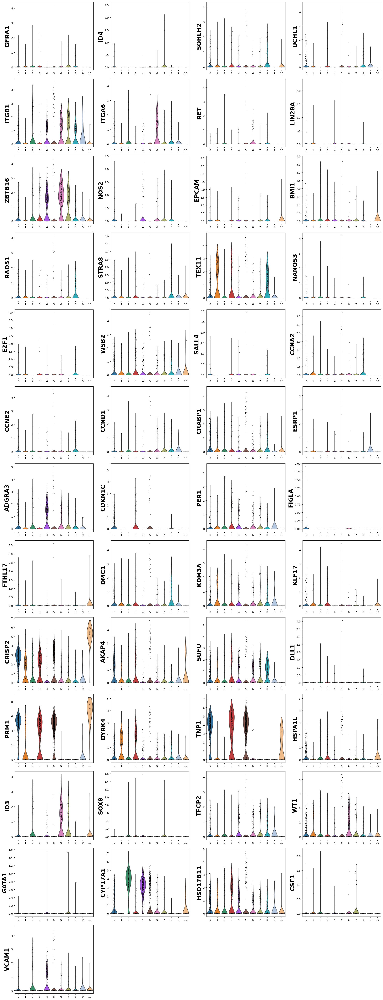

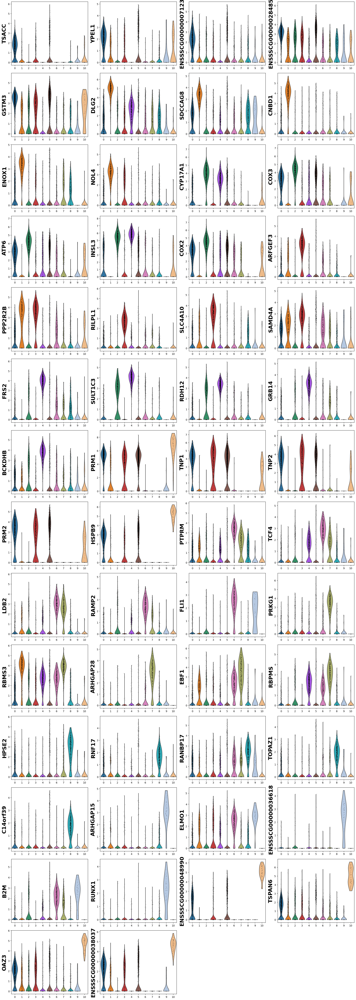

In [73]:
# Soeren Approach
adata, marker_genes, json_marker_cell_types = load_lukassen()
bdata = DifferentialExpressionAnalysis(adata, marker_genes, json_marker_cell_types, custom_leiden_res)

# do not use explicit marker genes 

# HVG

In [74]:
# highly expressed genes
sc.tl.filter_rank_genes_groups(
    bdata,
    key="dea_leiden_res",
    key_added="dea_leiden_res_filtered",
    min_in_group_fraction=0.2,
    max_out_group_fraction=0.2,
)

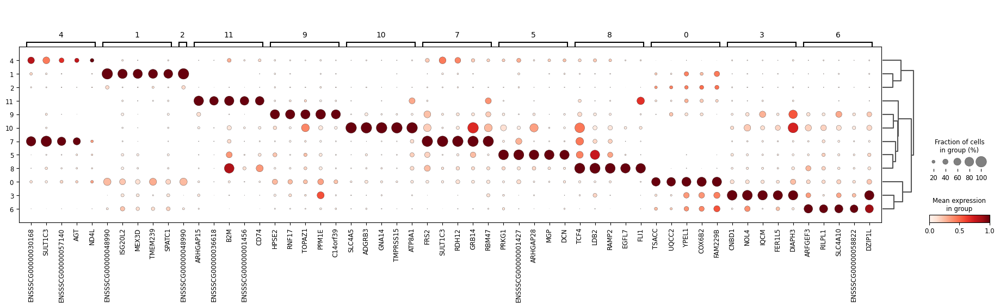

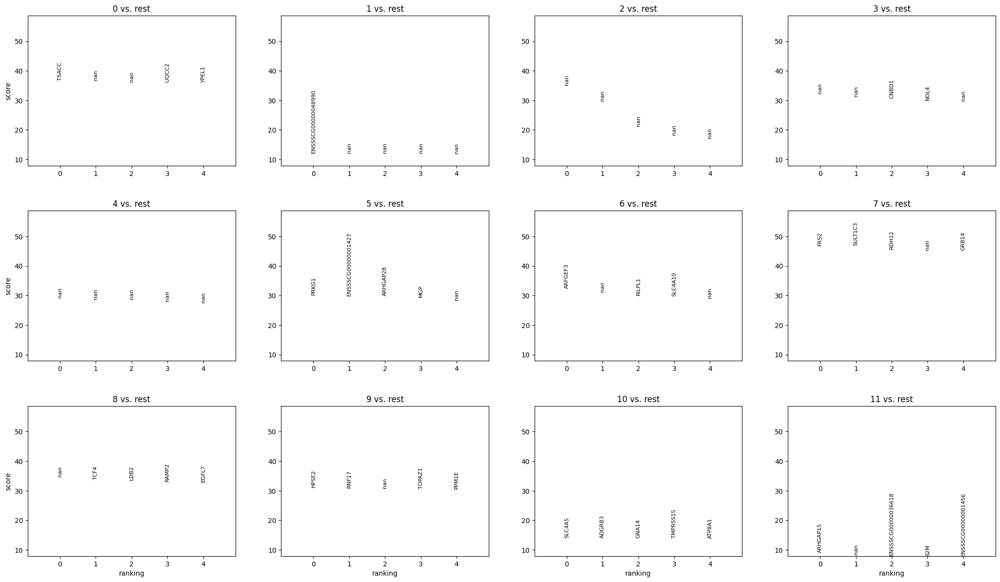

In [ ]:
sc.pl.rank_genes_groups_dotplot(
    bdata,
    groupby="leiden_res",
    standard_scale="var",
    n_genes=5,
    key="dea_leiden_res_filtered",
    save="0_2_wilcoxon_HEG_dotplot.png",
    cmap="Reds",
)

#create leiden on dea_leiden_res_filtered
sc.pl.rank_genes_groups(
    bdata,
    groups=None,
    n_genes=5,
    key="dea_leiden_res_filtered",
    save=f"0_2_wilcoxon_HEG_rank_plot.png",
)

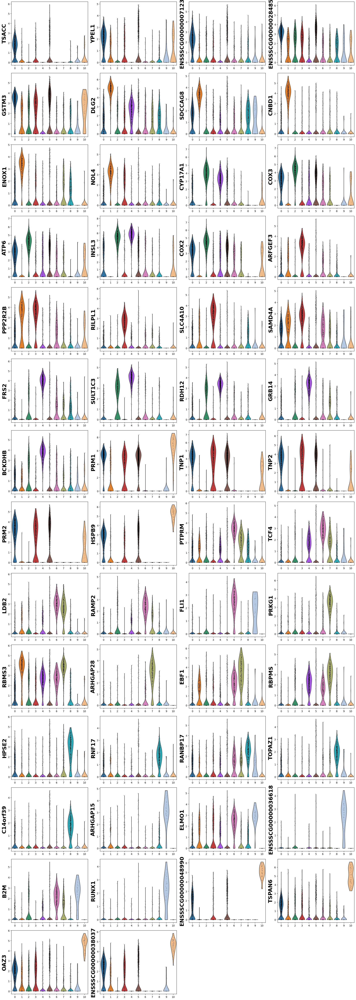

In [ ]:
# Extract top 5 genes per leiden_res cluster from wilcoxon results (key="dea_leiden_res")
top_n = 5
group_names = bdata.uns["dea_leiden_res"]["names"].dtype.names
top5_genes = []
for group in group_names:
    names = bdata.uns["dea_leiden_res"]["names"][group][:top_n]
    top5_genes.extend(names)
# Remove duplicates while preserving order
seen = set()
top5_genes_unique = [g for g in top5_genes if (g not in seen and not seen.add(g))]
if top5_genes_unique:
    n_cols = 4
    n_genes = len(top5_genes_unique)
    n_rows = (n_genes + n_cols - 1) // n_cols

    fig, axes = plt.subplots(
        nrows=n_rows, ncols=n_cols, figsize=(n_cols * 5, n_rows * 4), squeeze=False
    )

    axes = axes.flatten()
    for idx, gene in enumerate(top5_genes_unique):
        ax = axes[idx]
        sc.pl.violin(
            bdata,
            keys=gene,
            groupby="leiden_res",
            ax=ax,
            show=False,
        )
        ax.set_ylabel(gene, fontsize=22, fontweight='bold')
        ax.set_title("")
        ax.set_xlabel("")
    # Hide unused axes
    for idx in range(len(top5_genes_unique), len(axes)):
        fig.delaxes(axes[idx])

    plt.tight_layout()
    violin_fname = f"figures/violin_0_2_leiden_res_wilcox_HEG_top5.png"
    fig.savefig(violin_fname, bbox_inches="tight")
    plt.show()
else:
    print("No DEA top-5 genes found to plot violins.")

# Paper

{'SSCs': ['GFRA1', 'KIT', 'STRA8'], 'DiffingSPG': ['GFRA1', 'KIT', 'STRA8'], 'DiffedSPG': ['GFRA1', 'KIT', 'STRA8'], 'Leptotene': ['SPO11', 'TEX19'], 'Zygotene': ['SPO11'], 'PachyteneDiplotene': ['OVOL1', 'OVOL2', 'NME8'], 'RoundSpermatids': ['TXNDC2'], 'Sperm': ['TNP1', 'PRM1'], 'Macrophages': ['CD163', 'CD14'], 'Endothelial': ['PECAM1', 'VWF'], 'Leydig': ['VIT', 'IGF1', 'DLK1'], 'Myoid': ['MYH11', 'GLI1', 'ACTA2'], 'Sertoli': ['PRND', 'WFDC2', 'AMH', 'SOX9'], 'Pericytes': ['NOTCH3', 'SLIT3', 'PDGFRB', 'MCAM']}
RUNNING DIFFERENTIAL EXPRESSION ANALYSIS WITH RESOLUTION:  0.75
CREATING PLOTS FOR ALL THESE CELL TYPES:
 ['SSCs', 'DiffingSPG', 'DiffedSPG', 'Leptotene', 'Zygotene', 'PachyteneDiplotene', 'RoundSpermatids', 'Sperm', 'Macrophages', 'Endothelial', 'Leydig', 'Myoid', 'Sertoli', 'Pericytes']
SSCS:
DIFFINGSPG:
DIFFEDSPG:
LEPTOTENE:
ZYGOTENE:
PACHYTENEDIPLOTENE:
ROUNDSPERMATIDS:
  [SKIP] No marker genes found for RoundSpermatids in adata.var.index; skipping UMAP plot.
SPERM:
MACROPH

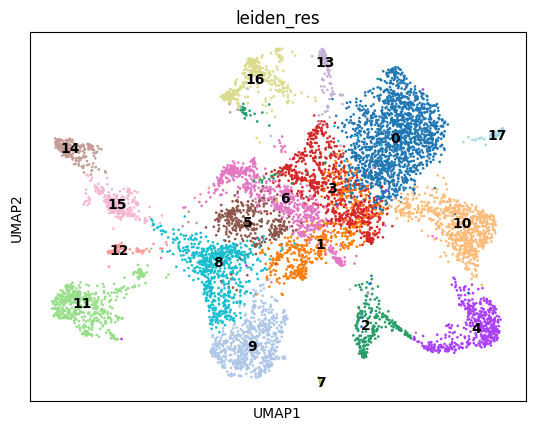

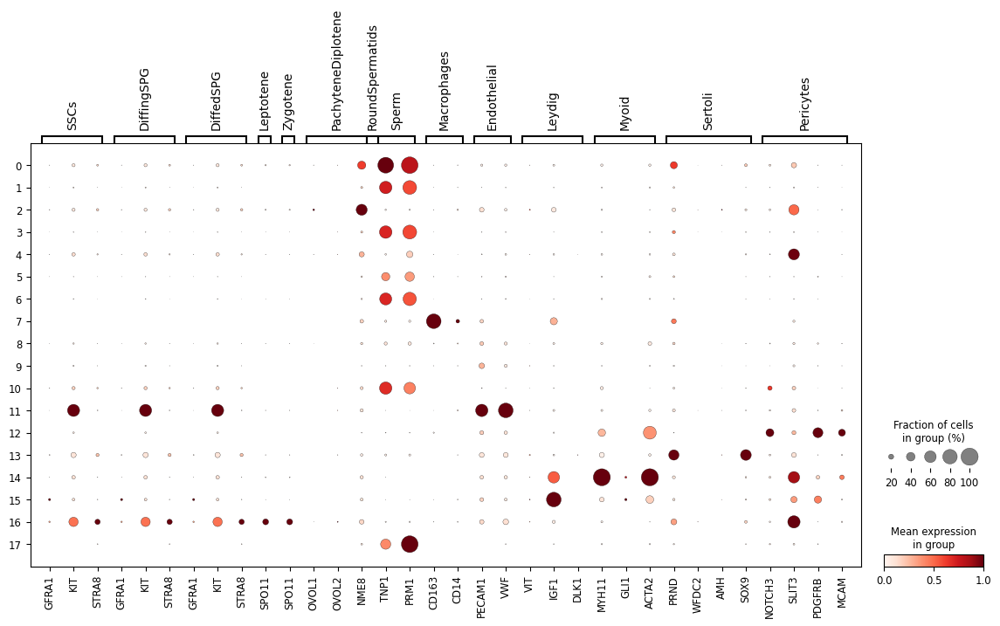

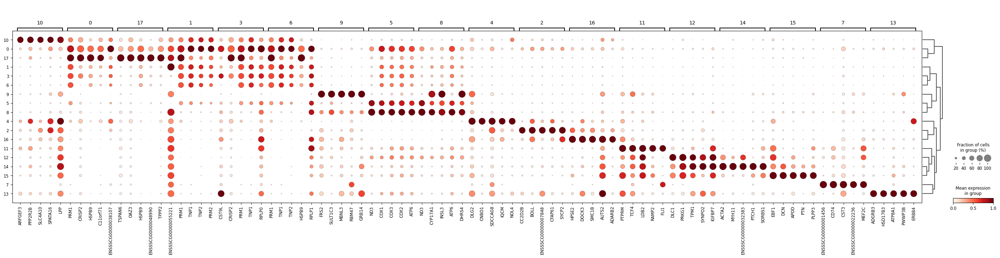

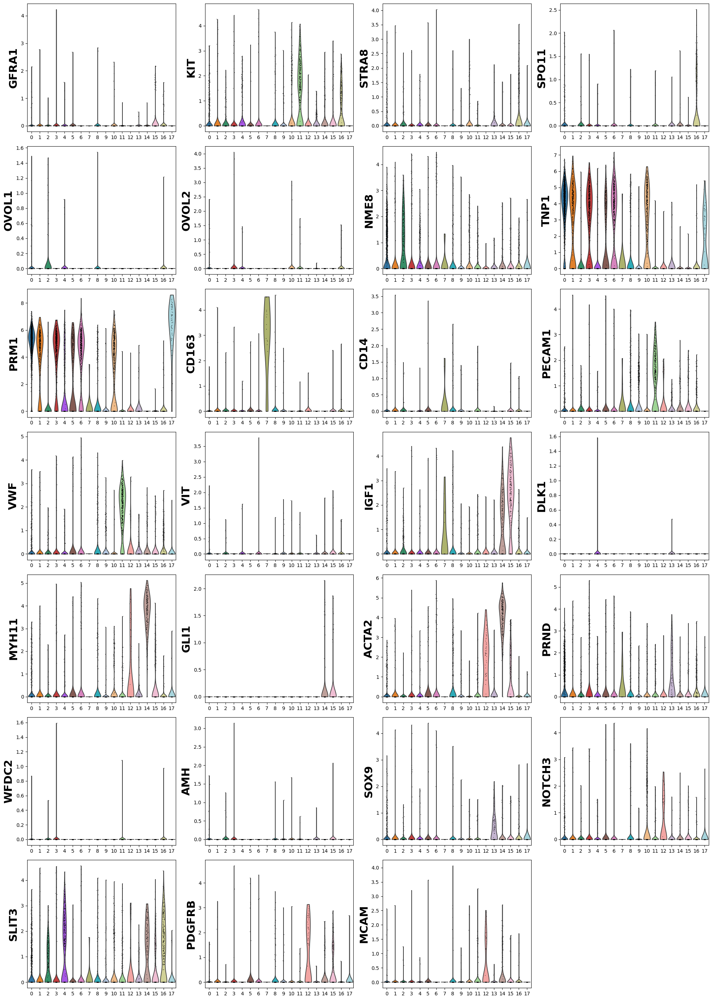

categories: 0, 1, 2, etc.
var_group_labels: 0, 2, 4, etc.


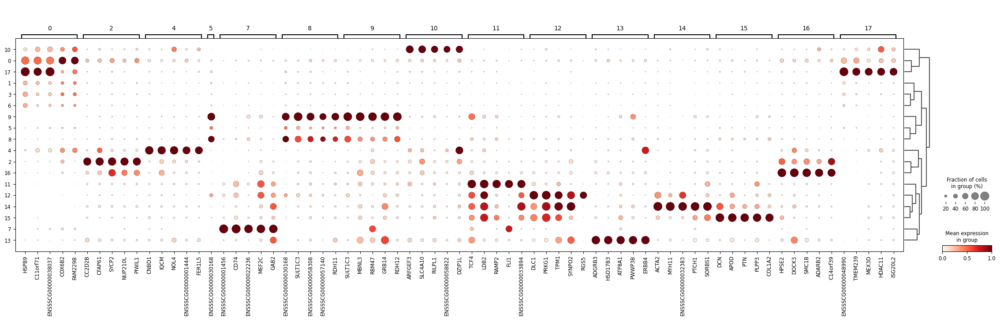

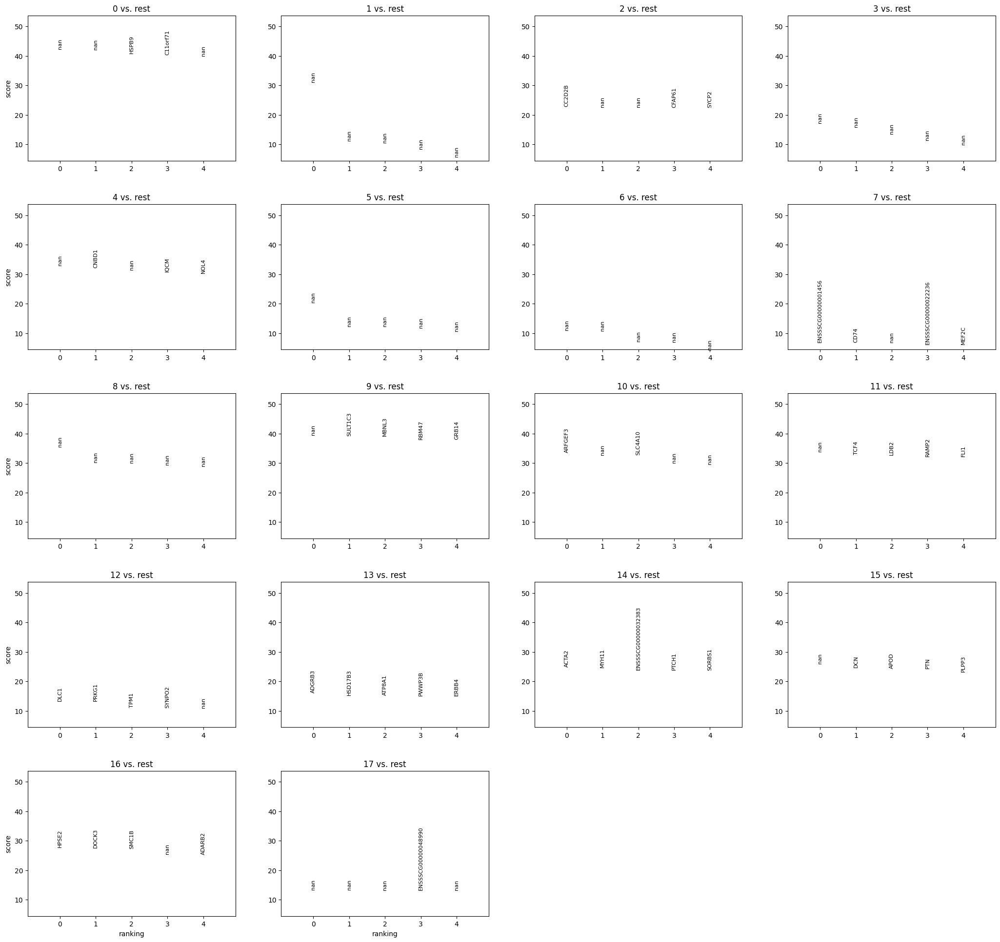

categories: 0, 1, 2, etc.
var_group_labels: 0, 2, 4, etc.


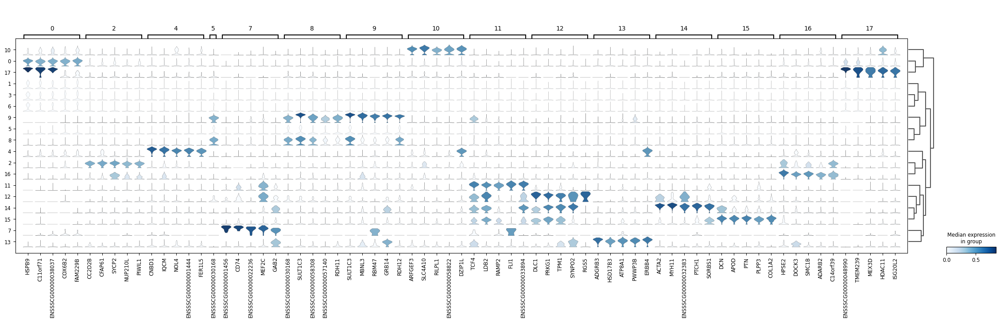

In [4]:
adata, paper_marker_genes, paper_cell_types = load_paper()
os.chdir("/Users/oskarhaupt/Documents/DE/2024_FU-Bachelor/WS-24-25/Charité/05_sorted/18_soupX_try/08_DEanalysis/paper")
DifferentialExpressionAnalysis(adata, paper_marker_genes, paper_cell_types, custom_leiden_res)

# end